# Problem: Predicting Credit Card Fraud 

## Introduction to business scenario
You work for a multinational bank. There has been a significant increase in the number of customers experiencing credit card fraud over the last few months. A major news outlet even recently published a story about the credit card fraud you and other banks are experiencing. 

As a response to this situation, you have been tasked to solve part of this problem by leveraging machine learning to identify fraudulent credit card transactions before they have a larger impact on your company. You have been given access to a dataset of past credit card transactions, which you can use to train a machine learning model to predict if transactions are fraudulent or not. 


## About this dataset
The dataset contains transactions made by credit cards in September 2013 by European cardholders. This dataset presents transactions that occurred over the course of two days and includes examples of both fraudulent and legitimate transactions.

### Features
The dataset contains over 30 numerical features, most of which have undergone principal component analysis (PCA) transformations because of personal privacy issues with the data. The only features that have not been transformed with PCA are 'Time' and 'Amount'. The feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction amount. 'Class' is the response or target variable, and it takes a value of '1' in cases of fraud and '0' otherwise.

Features: 
`V1, V2, ... V28`: Principal components obtained with PCA

Non-PCA features:
- `Time`: Seconds elapsed between each transaction and the first transaction in the dataset, $T_x - t_0$
- `Amount`: Transaction amount; this feature can be used for example-dependent cost-sensitive learning 
- `Class`: Target variable where `Fraud = 1` and `Not Fraud = 0`

### Dataset attributions
Website: https://www.openml.org/d/1597

Twitter: https://twitter.com/dalpozz/status/645542397569593344

Authors: Andrea Dal Pozzolo, Olivier Caelen, and Gianluca Bontempi
Source: Credit card fraud detection - June 25, 2015
Official citation: Andrea Dal Pozzolo, Olivier Caelen, Reid A. Johnson, and Gianluca Bontempi. Calibrating Probability with Undersampling for Unbalanced Classification. In Symposium on Computational Intelligence and Data Mining (CIDM), IEEE, 2015.

The dataset has been collected and analyzed during a research collaboration of Worldline and the Machine Learning Group (mlg.ulb.ac.be) of ULB (Université Libre de Bruxelles) on big data mining and fraud detection. More details on current and past projects on related topics are available on http://mlg.ulb.ac.be/BruFence and http://mlg.ulb.ac.be/ARTML.

# Step 1: Problem formulation and data collection

Start this project off by writing a few sentences below that summarize the business problem and the business goal you're trying to achieve in this scenario. Include a business metric you would like your team to aspire toward. With that information defined, clearly write out the machine learning problem statement. Finally, add a comment or two about the type of machine learning this represents.

### Read through a business scenario and:

### 1. Determine if and why ML is an appropriate solution to deploy.

> As we have a label historical dataset, and it is difficult to human to indicate wether it is a Fraud or not as the number of features and transaction is so large.

### 2. Formulate the business problem, success metrics, and desired ML output.

 > Identify fraudulent credit card transactions before they have a larger impact on a company.<br>
 > Decrease in the number of customers experiencing credit card fraud.<br>
 > Predict if there is a fraud or not.

### 3. Identify the type of ML problem you’re dealing with.

> Binary classification

### 4. Analyze the appropriateness of the data you’re working with.

> Good data for ML to work on.

### Setup

Now that we have decided where to focus our energy, let's set things up so you can start working on solving the problem.

**Note:** This notebook was created and tested on an `ml.m4.xlarge` notebook instance.

In [2]:
# Import various Python libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

!pip install plotly
import plotly.express as px
sns.set()
%matplotlib inline

In [2]:
# Install imblearn
!pip install imbalanced-learn==0.7.0
!pip install imblearn

     |████████████████████████████████| 167 kB 10.9 MB/s eta 0:00:01


### Downloading the dataset

In [3]:
# Check whether the file is already in the desired path or if it needs to be downloaded
# Data source: https://www.openml.org/data/get_csv/1673544/phpKo8OWT
import os
import subprocess


base_path = 'data/FraudDetection'
file_path = '/fraud.csv'

if not os.path.isfile(base_path + file_path):
    subprocess.run(['mkdir', '-p', base_path])
    print('dir made')
    df = pd.read_csv('https://www.openml.org/data/get_csv/1673544/phpKo8OWT')
    df.to_csv(base_path+file_path,index=False)
else:
    print('File already downloaded!')
    

File already downloaded!


# Step 2: Data preprocessing and visualization  
In this data preprocessing phase, you should take the opportunity to explore and visualize your data to better understand it. First, import the necessary libraries and read the data into a Pandas dataframe. After that, explore your data. Look for the shape of the dataset and explore your columns and the types of columns you're working with (numerical, categorical). Consider performing basic statistics on the features to get a sense of feature means and ranges. Take a close look at your target column and determine its distribution.

### Specific questions to consider
1. What can you deduce from the basic statistics you ran on the features? 

2. What can you deduce from the distributions of the target classes?

3. Is there anything else you deduced from exploring the data?

### Read the CSV data into a Pandas dataframe.

In [4]:
df = pd.read_csv(base_path+file_path)

### Check the dataframe by printing the first 5 rows of the dataset.  

In [5]:
df.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,'0'
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,'0'
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,'0'
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,'0'
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,'0'


### Check the dataframe Length.  

In [6]:
df.shape

(284807, 31)

### Check for Duplicate.  

In [7]:
df.duplicated().sum()

1081

In [8]:
df.drop_duplicates(inplace=True)

In [9]:
df.duplicated().any()

False

In [10]:
df.shape

(283726, 31)

### Information about the dataframe.  
Columns' type, Null values.

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 283726 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    283726 non-null  float64
 1   V1      283726 non-null  float64
 2   V2      283726 non-null  float64
 3   V3      283726 non-null  float64
 4   V4      283726 non-null  float64
 5   V5      283726 non-null  float64
 6   V6      283726 non-null  float64
 7   V7      283726 non-null  float64
 8   V8      283726 non-null  float64
 9   V9      283726 non-null  float64
 10  V10     283726 non-null  float64
 11  V11     283726 non-null  float64
 12  V12     283726 non-null  float64
 13  V13     283726 non-null  float64
 14  V14     283726 non-null  float64
 15  V15     283726 non-null  float64
 16  V16     283726 non-null  float64
 17  V17     283726 non-null  float64
 18  V18     283726 non-null  float64
 19  V19     283726 non-null  float64
 20  V20     283726 non-null  float64
 21  V21     28

### Convert `Class` to integer. 

In [12]:
# The class has a weird string instead of a boolean or numbers 0 and 1, so convert it to 0 and 1 
df['Class'] = df['Class'].str.strip("'").astype('int64')

In [13]:
# Check if that worked
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


**Task**: Validate all the columns in the dataset and see that they are what you read above: `V1-V28`, `Time`, `Amount`, and `Class`.

In [14]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

### Basic statistics

In [15]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,...,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000
mean,94811.077600,0.005917,-0.004135,0.001613,-0.002966,0.001828,-0.001139,0.001801,-0.000854,-0.001596,...,-0.000371,-0.000015,0.000198,0.000214,-0.000232,0.000149,0.001763,0.000547,88.472687,0.001667
std,47481.047891,1.948026,1.646703,1.508682,1.414184,1.377008,1.331931,1.227664,1.179054,1.095492,...,0.723909,0.724550,0.623702,0.605627,0.521220,0.482053,0.395744,0.328027,250.399437,0.040796
min,0.000000,-56.407510,-72.715728,-48.325589,-5.683171,-113.743307,-26.160506,-43.557242,-73.216718,-13.434066,...,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.604551,-22.565679,-15.430084,0.000000,0.000000
25%,54204.750000,-0.915951,-0.600321,-0.889682,-0.850134,-0.689830,-0.769031,-0.552509,-0.208828,-0.644221,...,-0.228305,-0.542700,-0.161703,-0.354453,-0.317485,-0.326763,-0.070641,-0.052818,5.600000,0.000000
50%,84692.500000,0.020384,0.063949,0.179963,-0.022248,-0.053468,-0.275168,0.040859,0.021898,-0.052596,...,-0.029441,0.006675,-0.011159,0.041016,0.016278,-0.052172,0.001479,0.011288,22.000000,0.000000
75%,139298.000000,1.316068,0.800283,1.026960,0.739647,0.612218,0.396792,0.570474,0.325704,0.595977,...,0.186194,0.528245,0.147748,0.439738,0.350667,0.240261,0.091208,0.078276,77.510000,0.000000
max,172792.000000,2.454930,22.057729,9.382558,16.875344,34.801666,73.301626,120.589494,20.007208,15.594995,...,27.202839,10.503090,22.528412,4.584549,7.519589,3.517346,31.612198,33.847808,25691.160000,1.000000


> It seems that the `Amount` is left skewed.

In [16]:
print("Fraud Statistics")

avg_amt = df.Amount.mean()
med_amt = df.Amount.quantile(0.5)
std_dev = df.Amount.std()
max_amt = df.Amount.max()

print(f"The average amount is {avg_amt}")
print(f"The median amount is {med_amt}")
print(f"The std deviation for amount is {std_dev}")
print(f"The max amount is {max_amt}")

Fraud Statistics
The average amount is 88.47268731099724
The median amount is 22.0
The std deviation for amount is 250.39943711577337
The max amount is 25691.16


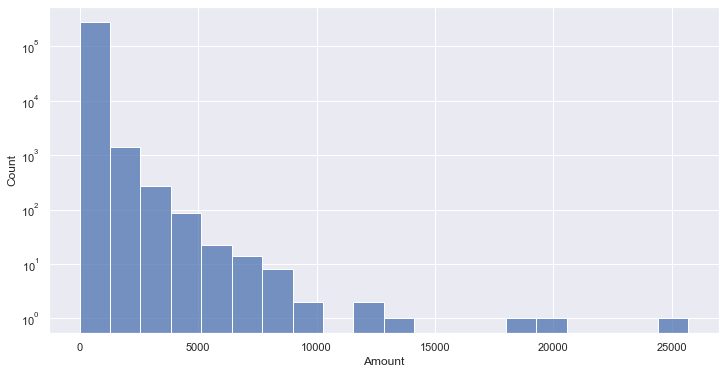

In [17]:
plt.figure(figsize=(12,6))
sns.histplot(df.Amount,bins=20);
plt.yscale('log')

### Now look at the target variable, `Class`.
> First, we can find out what the distribution is for it.

In [18]:
class_dis = df.Class.value_counts()
class_dis

0    283253
1       473
Name: Class, dtype: int64

In [19]:
class_dis[0]/df.shape[0]

0.9983328986416472

> Fraud= 473<br>
> legitimate = 283253<br>
> Data is highly imbalanced

### Assumption
> As we know this dataset contains transactions made by credit cards in September 2013.<br>
> We assume the first transaction happen in Monday, September 2, 2013 12:00:00 AM.<br>
> So the Epoch `timestamp` is 1378080000.

#### Convert `Time` to `timestamp` so we can convert it later to Date.

In [20]:
# first transaction happen in Monday, September 2, 2013 12:00:00 AM.
refer_timestamp = 1378080000 

df['Time'] = df['Time'].astype('int')+ refer_timestamp
df['Time'].head()

0    1378080000
1    1378080000
2    1378080001
3    1378080001
4    1378080002
Name: Time, dtype: int32

In [21]:
df['Time'] = df['Time'].apply(lambda x: pd.Timestamp(x,unit='s'))
df['Time']

0        2013-09-02 00:00:00
1        2013-09-02 00:00:00
2        2013-09-02 00:00:01
3        2013-09-02 00:00:01
4        2013-09-02 00:00:02
                 ...        
284802   2013-09-03 23:59:46
284803   2013-09-03 23:59:47
284804   2013-09-03 23:59:48
284805   2013-09-03 23:59:48
284806   2013-09-03 23:59:52
Name: Time, Length: 283726, dtype: datetime64[ns]

## Visualize the data

### Specific questions to consider
1. After looking at the distributions of features like `Amount` and `Time`, to what extend might those features help your model? Is there anything you can deduce from those distributions that might be helpful in better understanding your data?

2. Do the distributions of features like `Amount` and `Time` differ when you are looking only at data that is labeled as fraud?

3. Are there any features in your dataset that are strongly correlated? If so, what would be your next steps?


### Resample the data by hour

In [22]:
tran_time = df.set_index('Time')
tran_time = tran_time['Class'].resample('H').count()
tran_time = tran_time.reset_index()
tran_time.head()

,Time,Class
0,2013-09-02 00:00:00,3931
1,2013-09-02 01:00:00,2213
2,2013-09-02 02:00:00,1573
3,2013-09-02 03:00:00,1818
4,2013-09-02 04:00:00,1082


In [23]:
tran_time['Day'] = tran_time['Time'].dt.day.astype('str')
px.bar(data_frame=tran_time
       ,x='Time'
       ,y='Class'
       ,color='Day'
       ,title='Number of transaction for each day'.title()
      )

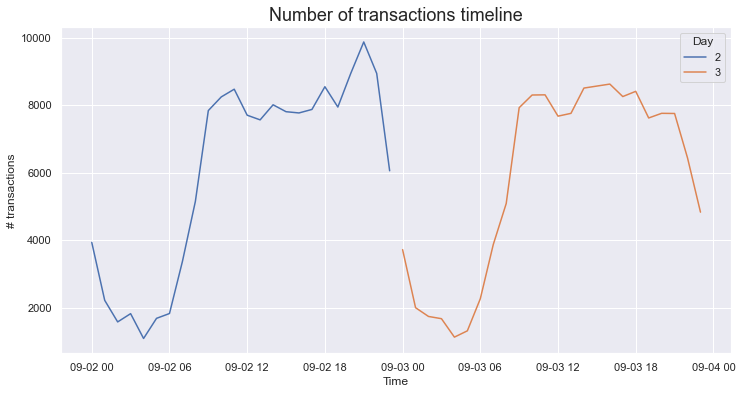

In [24]:
plt.figure(figsize = (12,6))
sns.lineplot(data=tran_time
             ,x='Time'
             ,y='Class'
             ,hue='Day')
plt.title('Number of transactions timeline',fontdict={'size':'18'})
plt.ylabel('# transactions')
plt.show()

In [25]:
fraud_time = df.set_index('Time')
fraud_time = fraud_time['Class'].resample('H').sum()
fraud_time = fraud_time.reset_index()
fraud_time.head()

,Time,Class
0,2013-09-02 00:00:00,2
1,2013-09-02 01:00:00,2
2,2013-09-02 02:00:00,21
3,2013-09-02 03:00:00,13
4,2013-09-02 04:00:00,6


In [26]:
fraud_time['Day'] = fraud_time['Time'].dt.day.astype('str')
px.bar(data_frame=fraud_time
       ,x='Time'
       ,y='Class'
       ,color='Day'
       ,title='Number of Fraud transaction for each Day'.title()
      )

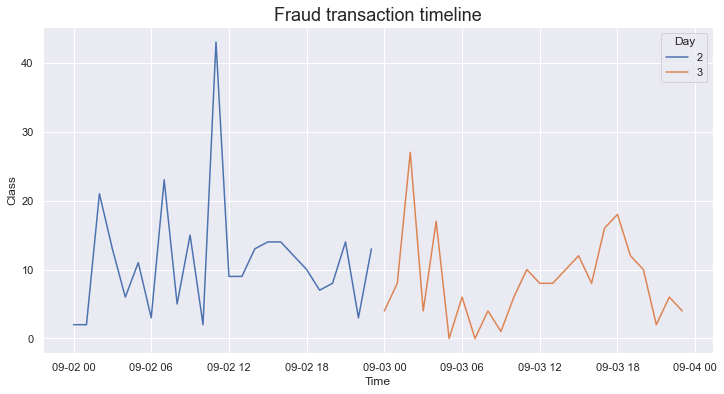

In [27]:
plt.figure(figsize = (12,6))
sns.lineplot(data=fraud_time
             ,x='Time'
             ,y='Class'
             ,hue='Day')
plt.title('Fraud transaction timeline',fontdict={'size':'18'})
plt.show()

**Distribution** of `Time` differ when we are looking only at data that is labeled as fraud<br>
As we see number of transactions is low at 12am to 6am, then it increase, in fraud case it's random no exact pattern here.

> We neglict the `Day`, and just consider the `hour`

In [28]:
df['Hour'] = df['Time'].dt.hour

In [29]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Hour
0,2013-09-02 00:00:00,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0
1,2013-09-02 00:00:00,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0
2,2013-09-02 00:00:01,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0
3,2013-09-02 00:00:01,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0
4,2013-09-02 00:00:02,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0


In [30]:
df_hour = df.groupby(['Hour','Class']).agg({'Class':'count'})
df_hour.columns=['Num_trans']
df_hour = df_hour.reset_index()
df_hour.head()

,Hour,Class,Num_trans
0,0,0,7641
1,0,1,6
2,1,0,4198
3,1,1,10
4,2,0,3260


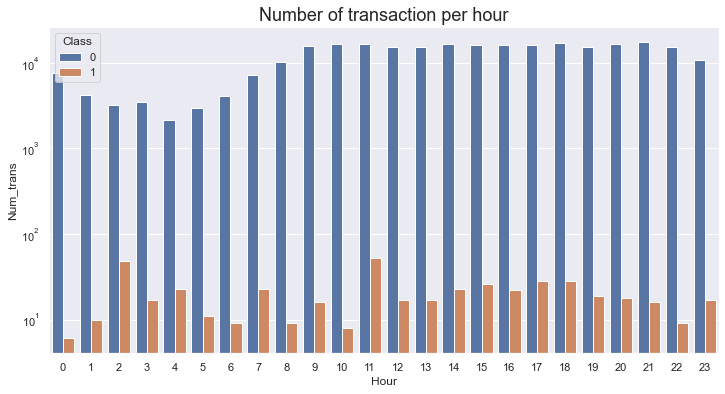

In [31]:
plt.figure(figsize=(12,6))
sns.barplot(data=df_hour
             ,x='Hour'
             ,y='Num_trans'
            ,hue='Class'
           )
plt.yscale('log')
plt.title('Number of transaction per hour',fontdict={'size':'18'})
plt.show()

As we see the number of **transactions** starts `increasing` at 4:00 AM until it reach 10:00 PM, it begins to `decrease` again, but in fraud case as we mentioned earlier, it's random distribution and there is no exact pattern here.

In [32]:
night_hour = [16,17,18,19,20,21,22,23,24,0,1,2,3,4]
df_hour['Hour'].isin(night_hour)
print('Number of fraud at Day: ',df_hour.loc[(df_hour['Hour'].isin(night_hour)==False) & (df_hour['Class']==1),'Num_trans'].sum())
print('Number of fraud at Night: ',df_hour.loc[df_hour['Hour'].isin(night_hour)& df_hour['Class']==1,'Num_trans'].sum())

Number of fraud at Day:  212
Number of fraud at Night:  261


> The fraud happen at both Day and night with small difference between them<br>
> It is not easy to differentiate the fraud and not fraud<br>

In [33]:
px.histogram(df
             ,x='Amount'
             ,color='Class'
             ,log_y=True
             ,nbins=100
            )

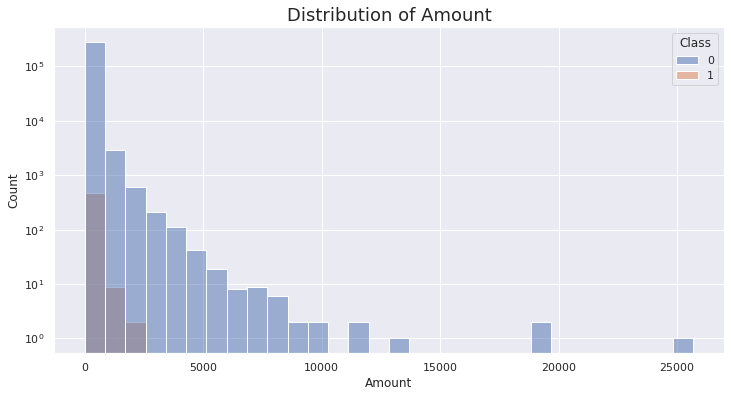

In [30]:
plt.figure(figsize=(12,6))
sns.histplot(data=df
             ,x='Amount'
             ,hue='Class'
             ,bins=30
            )
plt.yscale('log')
plt.title('Distribution of Amount',fontdict={'size':'18'})
plt.show()

**Distribution** of `Amount` is still the same when we are looking only at data that is labeled as fraud<br>

Now let's look at a distribution using a Seaborn function called `pairplot`. `pairplot` creates a grid of scatterplots, such that each feature in the dataset is used once as the X-axis and once as the Y-axis. The diagonal of this grid shows a distribution of the data for that feature. 

Look at `V1`, `V2`, `V2`, `V4`, and `Class` pairplots. What do you see in the plots? Can you differentiate the fraud and not fraud from these features?  

**Hint**: Create a new dataframe with columns `V1`, `V2`, `V4`, and `Class`.

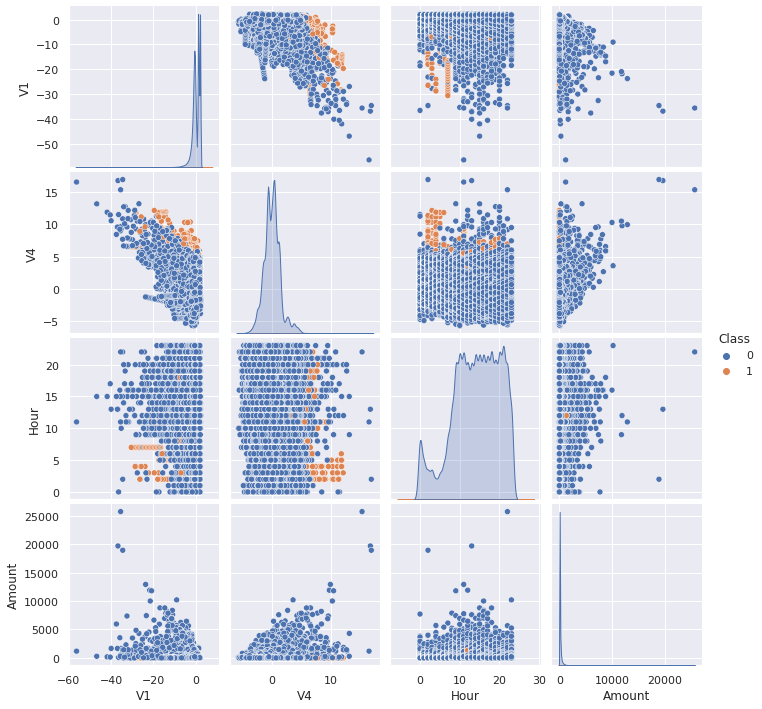

In [31]:
new_df = df[['V1', 'V4', 'Hour','Amount', 'Class']]
sns.pairplot(new_df, hue="Class");

You can see for the smaller subset of the features that we used, there is a way to differentiate the fraud and not fraud,<br> but it's not easy to separate it based on any one feature.

### How features interact with each other.

#### Check correlation between features generated by PCA

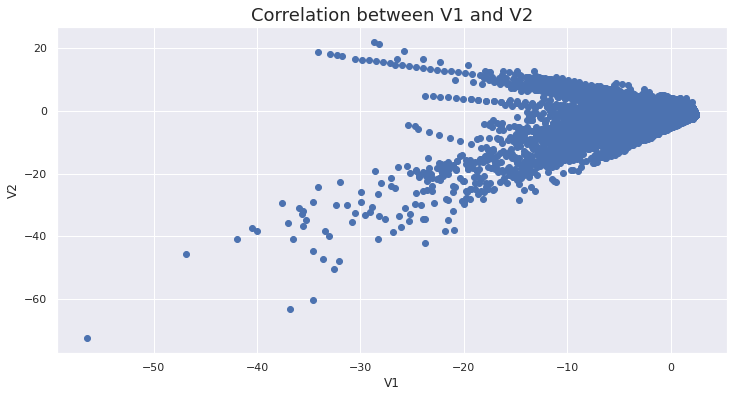

In [32]:
plt.figure(figsize = (12,6))
plt.scatter(df.V1 , df.V2)
plt.xlabel('V1')
plt.ylabel('V2')
plt.title('Correlation between V1 and V2',fontdict={'size':'18'})
plt.show()

As we expected There is no Correlation between `v1` and `v2` as they generated by PCA.

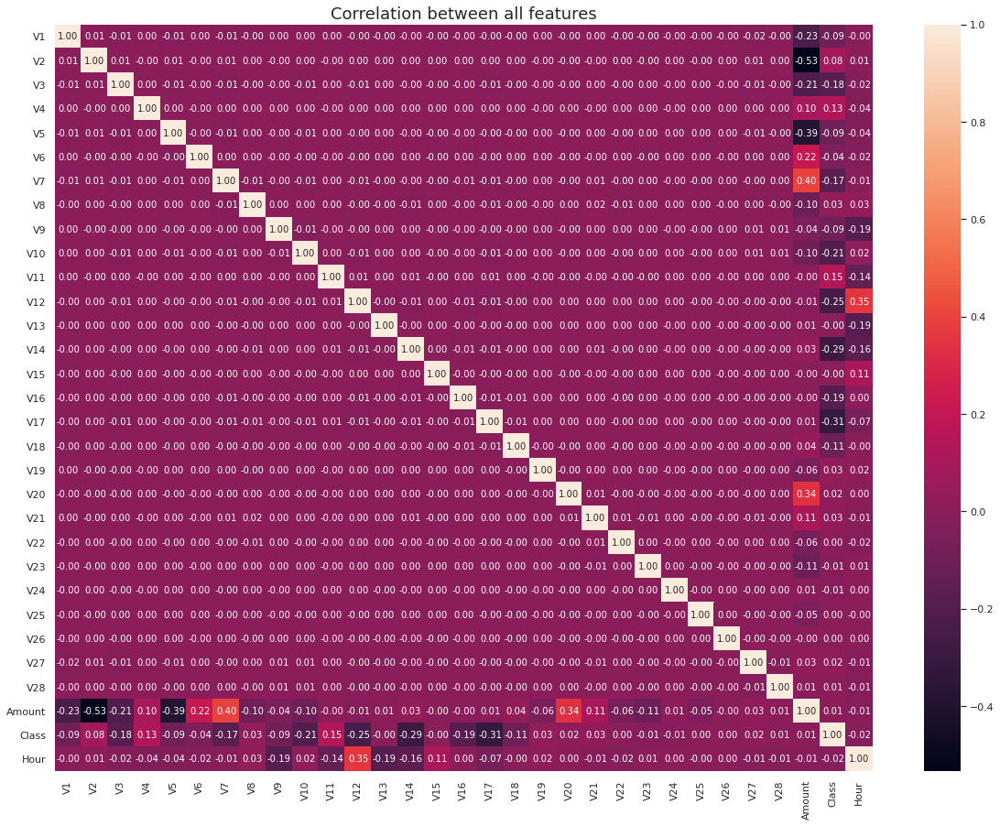

In [33]:
plt.figure(figsize = (20,15))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True,fmt=".2f")
plt.title('Correlation between all features',fontdict={'size':'18'})
plt.show()

There is `no strong` correlation here.

# Step 3: Model training and evaluation

There are some preliminary steps that you have to include when converting the dataset from a DataFrame to a format that a machine learning algorithm can use. For Amazon SageMaker, here are the steps you need to take:

1. Split the data into `train_data`, `validation_data`, and `test_data` using `sklearn.model_selection.train_test_split`.    
2. Convert the dataset to an appropriate file format that the Amazon SageMaker training job can use. This can be either a CSV file or record protobuf. For more information, see [Common Data Formats for Training](https://docs.aws.amazon.com/sagemaker/latest/dg/cdf-training.html).    
3. Upload the data to your Amazon S3 bucket.


- The Amazon Simple Storage Service (Amazon S3) bucket and prefix(?) that you want to use for training and model data. This should be within the same Region as the notebook instance, training, and hosting.
- The AWS Identity and Access Management (IAM) role [Amazon Resource Name (ARN)](https://docs.aws.amazon.com/general/latest/gr/aws-arns-and-namespaces.html) used to give training and hosting access to your data. See the documentation for how to create these.

**Note:** If more than one role is required for notebook instances, training, and/or hosting, replace the `get_execution_role()` call with the appropriate full IAM role ARN string(s).

Replace **`<LabBucketName>`** with the resource name that you have.

In [ ]:
import boto3
import sagemaker
from sagemaker import get_execution_role
from sagemaker.amazon.amazon_estimator import image_uris
from sagemaker.amazon.amazon_estimator import RecordSet

# Instantiate an Amazon SageMaker session
sess = sagemaker.Session()

# Get the Amazon SageMaker role 
role = get_execution_role()

# Bucket name
bucket = <LabBucketName>

# Get the image URI for the container that includes the linear learner algorithm
container = image_uris.retrieve('linear-learner',boto3.Session().region_name)

print(f'Session {sess}')
print(f'The role is {role}')
print(f'The container is {role} in the {boto3.Session().region_name} region')

In [35]:
from sklearn.model_selection import train_test_split

def create_training_sets(df,target):
    """
    Convert data frame to train, validation and test
    params:
        data: The dataframe with the dataset to be split
    Returns:
        train_features: Training feature dataset
        test_features: Test feature dataset 
        train_labels: Labels for the training dataset
        test_labels: Labels for the test dataset
        val_features: Validation feature dataset
        val_labels: Labels for the validation dataset
    """
    df = df.sample(frac=1,random_state=42)
    # Extract the target variable from the dataframe and convert the type to float32
    ys = np.array(df[target]).astype("float32")
    
    # Drop the target column from df and convert the data into a NumPy array of type float32
    xs = np.array(df.drop(columns=target)).astype("float32")
    
    np.random.seed(0)

    # Use the sklearn function train_test_split to split the dataset in the ratio train 80% and test 20%
    
    train_features, test_features, train_labels, test_labels = train_test_split(xs, ys, test_size=0.2)
    
    # Use the sklearn function again to split the test dataset into 50% validation and 50% test
    val_features, test_features, val_labels, test_labels = train_test_split(test_features, test_labels, test_size=0.5)
    
    return train_features, test_features, train_labels, test_labels, val_features, val_labels

In [97]:
# Remove Time column as we have Hour now.
df.drop(columns='Time',inplace=True)

In [37]:
# Use the function to create your datasets
train_features, test_features, train_labels, test_labels, val_features, val_labels = create_training_sets(df,'Class')

print("Length of train_features is:", train_features.shape)
print("Length of train_labels is:" ,train_labels.shape)
print("Length of val_features is: ",val_features.shape)
print("Length of val_labels is: ",val_labels.shape)
print("Length of test_features is: ",test_features.shape)
print("Length of test_labels is: ",test_labels.shape)

Length of train_features is: (226980, 30)
Length of train_labels is: (226980,)
Length of val_features is:  (28373, 30)
Length of val_labels is:  (28373,)
Length of test_features is:  (28373, 30)
Length of test_labels is:  (28373,)


### Model training

Lets start by instantiating the LinearLearner estimator with `predictor_type='binary_classifier'` parameter with one ml.m4.xlarge instance.

In [41]:
# Instantiate the LinearLearner estimator 'binary classifier' object with one ml.m4.xlarge instance
linear = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               instance_count=1,
                                               instance_type='ml.m5.xlarge',
                                               predictor_type='binary_classifier')

Linear learner accepts training data in protobuf or CSV content types, and accepts inference requests in protobuf, CSV, or JSON content types.<br> 
Training data has features and ground-truth labels, while the data in an inference request has only features.<br>
In a production pipeline, it is recommended to convert the data to the Amazon SageMaker protobuf format and store it in Amazon S3.<br> 

However, to get up and running quickly, AWS provides the convenient method `record_set` for converting and uploading when the dataset is small enough to fit in local memory. It accepts NumPy arrays like the ones you already have, so let's use it here<br>

The `RecordSet` object will keep track of the temporary Amazon S3 location of your data.<br> 
Use the `estimator.record_set` function to create train, validation, and test records.<br> 
Then, use the `estimator.fit` function to start your training job.

In [42]:
### Create train, val, test records
train_records = linear.record_set(train_features, train_labels, channel='train')
val_records = linear.record_set(val_features, val_labels, channel='validation')
test_records = linear.record_set(test_features, test_labels, channel='test')

(<class 'sagemaker.amazon.amazon_estimator.RecordSet'>, {'s3_data': 's3://sagemaker-us-west-2-821202580419/sagemaker-record-sets/LinearLearner-2021-03-22-18-27-02-110/.amazon.manifest', 'feature_dim': 30, 'num_records': 226980, 's3_data_type': 'ManifestFile', 'channel': 'train'})


In [43]:
### Fit the classifier
linear.fit([train_records,val_records,test_records], wait=True, logs='All')

Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


## Model evaluation
In this section, you'll evaluate your trained model. First, use the `estimator.deploy` function with `initial_instance_count= 1` and `instance_type= 'ml.m4.xlarge'` to deploy your model on Amazon SageMaker.

In [45]:
linear_predictor = linear.deploy(initial_instance_count=1, instance_type='ml.m4.xlarge')

Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


---------------!

Now that you have a hosted endpoint running, you can make real-time predictions from the model easily by making an http POST request.<br> But first, you'll need to
> set up `serializers` and `deserializers` for passing your `test_features` NumPy arrays to the model behind the endpoint.<br> You will also calculate the `confusion matrix` for your model to evaluate how it has done on your test data visually.

In [46]:
from sklearn.metrics import accuracy_score,precision_score, recall_score


def predict_batches(model, features, labels, split=200):
    """
    Predict datapoints in batches specified by the split. 
    The data will be split into <split> parts and model.predict is called 
    on each part
    Arguments:
        model: The model that you will use to call predict function
        features: The dataset to predict on
        labels: The true value of the records
        split: Number of parts to split the data into
    Returns:
        None
    """

    split_array = np.array_split(features, split)
    predictions = []
    for array in split_array:
        predictions +=  model.predict(array)

    preds = [i.label['predicted_label'].float32_tensor.values[0] for i in predictions]
    
    # Calculate accuracy
    accuracy = accuracy_score(labels, preds)
    print(f'Accuracy: {accuracy}')
    
    # Calculate precision
    precision = precision_score(labels, preds)
    print(f'Precision: {precision}')
    
    # Calculate recall
    recall = recall_score(labels, preds)
    print(f'Recall: {recall}')
    
    confusion_matrix = pd.crosstab(index=labels
                                   , columns=np.round(preds)
                                   , rownames=['True']
                                   , colnames=['predictions']
                                  ).astype(int)
    plt.figure(figsize = (5,5))
    sns.heatmap(confusion_matrix
                , annot=True
                , fmt='.2f'
                , cmap="YlGnBu"
               ).set_title('Confusion Matrix') 
    

Accuracy: 0.9992598597257957
Precision: 0.7659574468085106
Recall: 0.782608695652174


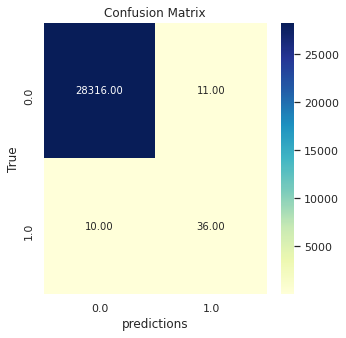

In [47]:
predict_batches(linear_predictor, test_features, test_labels)

Similar to the test set, you can also look at the metrics for the training set. Keep in mind that those are also shown to you above in the logs.

Accuracy: 0.999431667988369
Precision: 0.8600583090379009
Recall: 0.7845744680851063


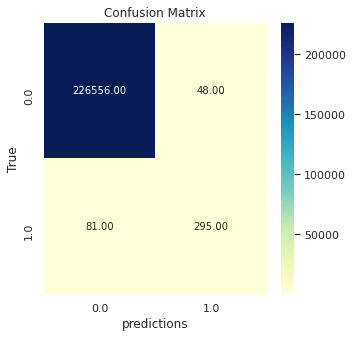

In [48]:
predict_batches(linear_predictor, train_features, train_labels)

### Key questions to consider:
1. How does your model's performance on the test set compare to the training set? What can you deduce from this comparison?<br>
> It seem the same resulton test and training, we can deduce that the model is underfitting and still need to more learning/training.


2. Are there obvious differences between the outcomes of metrics like accuracy, precision, and recall? If so, why might you be seeing those differences? 
> Yes, the percesion is larger than the others, as the data imbalance it seem logically to get high value with percision than recall because if we have 1000 datapoints 100 Fraud and 900 not fraud at the worst case if the model predict all as not fraud the accuracy will be 90% and recall/percsion will be 0.<br>

<img src="images/conf_mat.png" width="600" height="600">


3. Given your business situation and goals, which metric(s) is most important for you to consider here? Why?<br>
> Recall, as the cost of predicting someone not Fraud although he is, more than predicting someone fraud and he is'nt.<br>


4. Is the outcome for the metric(s) you consider most important sufficient for what you need from a business standpoint? If not, what are some things you might change in your next iteration (in the feature engineering section, which is coming up next)? <br>
> No, Try to resample the dataset, remove correlation if exist and try to rescale the features.

In [51]:
# Delete inference endpoint
sagemaker.Session().delete_endpoint(linear_predictor.endpoint)

The endpoint attribute has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


# Step 4: Feature engineering

You've now gone through one iteration of training and evaluating your model. Given that the outcome you reached for your model the first time probably wasn't sufficient for solving your business problem, what are some things you could change about your data to possibly improve model performance?

### Key questions to consider:
1. How might the balance of your two main classes (fraud and not fraud) impact model performance?
2. Does balancing your dataset have any impact on correlations between your features?
3. Are there feature reduction techniques you could perform at this stage that might have a positive impact on model performance? 
4. After performing some feature engineering, how does your model performance compare to the first iteration?

The accuracy is calculated with how many examples the model got right. However, most of the examples are actually negative, so if you actually predict all examples as zero in this very imbalanced dataset, you can still get an accuracy of about 99.827%. Having an imbalanced dataset may cause some problems with algorithm performance. So it's useful to treat the imbalance in the data before you train the model.

**Question**: How do you solve the problem of dataset imbalance?


Use `sns.countplot` to plot the original distribution of the dataset.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Original Distribution of the dataset')

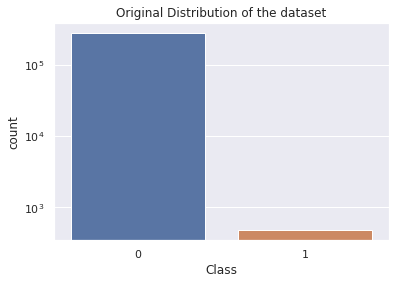

In [49]:
sns.countplot(df['Class'])
plt.yscale('log')
plt.title('Original Distribution of the dataset')

Convert `train_features` back into a DataFrame.

In [98]:
df.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class',
       'Hour'],
      dtype='object')

In [99]:
df_train = df 
df_train.rename(columns={'Class':'Target'}
                ,inplace=True)

In [100]:
df_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Amount,Target,Hour
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0


There are two main ways to handle imbalanced datasets:

- Oversample to add more positive samples
    - Random oversampling
    - [Synthetic minority oversampling technique (SMOTE)](https://arxiv.org/abs/1106.1813)
- Undersample to reduce the negative samples
    - Random undersampling
    - Generate centroids using clustering methods

You can use a library called `Imbalanced-learn` for sampling the datasets. `imbalanced-learn` is a Python package offering a number of resampling techniques commonly used in datasets showing strong between-class imbalance. It is compatible with scikit-learn and is part of scikit-learn-contrib projects. For more information, see [imbalanced-learn API documentation](https://imbalanced-learn.org/stable/introduction.html). 

Choose undersampling for this example first. To create the balanced dataset:

1. Create a new DataFrame `fraud_df` with all the positive examples.
2. Create another DataFrame `non_fraud_df` and use `dataframe.sample` with the same number as the `fraud_df` DataFrame and `random_state=235`.
3. Concatenate both DataFrames into a new DataFrame `balanced_df`.

In [101]:
# Select the rows in df_train dataframe where Target == 1
fraud_df = df_train[df_train.Target==1]

# Select the rows in df_train dataframe where Target == 0
non_fraud_df = df_train[df_train.Target==0].sample(n=fraud_df.shape[0]) # Enter your code here

balanced_df = pd.concat([fraud_df, non_fraud_df], ignore_index=True, sort=False)

balanced_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Amount,Target,Hour
0,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,...,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,0.00,1,0
1,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,...,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,529.00,1,0
2,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,-1.525412,...,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,239.93,1,1
3,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,...,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,59.00,1,1
4,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,...,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1.00,1,2


Check the distribution and shape again using `sns.countplot()`.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



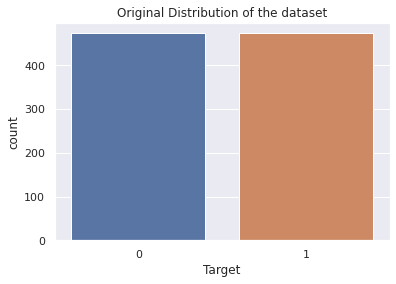

In [70]:
sns.countplot(balanced_df['Target'])
plt.title('Original Distribution of the dataset')
plt.show()

In [102]:
balanced_df.shape

(946, 31)

In [78]:
balanced_df.duplicated().sum()

0

Before looking at the training, look at what will happen if you use a feature reduction technique like t-Distributed Stochastic Neighbor Embedding (t-SNE) on the dataset.

In [103]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2).fit_transform(balanced_df.drop(columns=['Target']))
X_embedded.shape

(946, 2)

Text(0.5, 1.0, 'Red: 0 , Blue: 1')

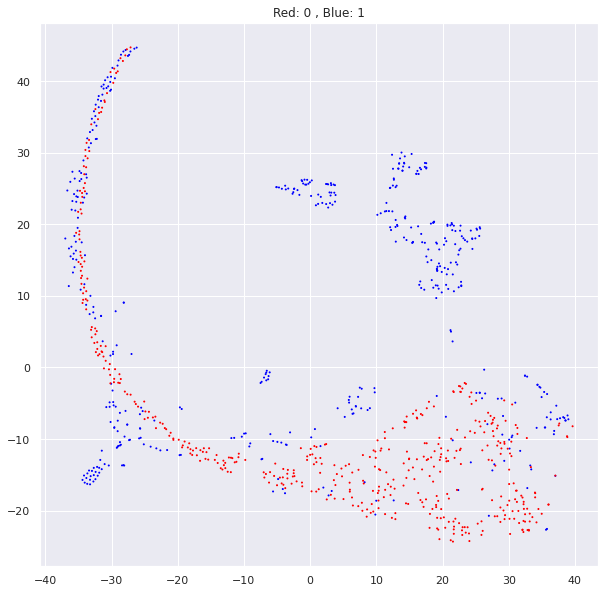

In [104]:
from matplotlib.colors import ListedColormap
plt.figure(figsize = (10,10))
plt.scatter(X_embedded[:,0], X_embedded[:,1], 
            c = balanced_df['Target'],
            s = 1,
            cmap = ListedColormap(['Red', 'Blue']),
            linewidths=1)

plt.title('Red: 0 , Blue: 1')

**Question**: Does t-SNE help you differentiate the fraud from not fraud?  

**Answer:** t-SNE can differentiate between some of the fraud and not fraud cases, but it doesn't do a good job of completely differentiating the two when we reduce the data to just two dimensions.

Now that you have the new data, compare what the correlation matrix looks like before and after.

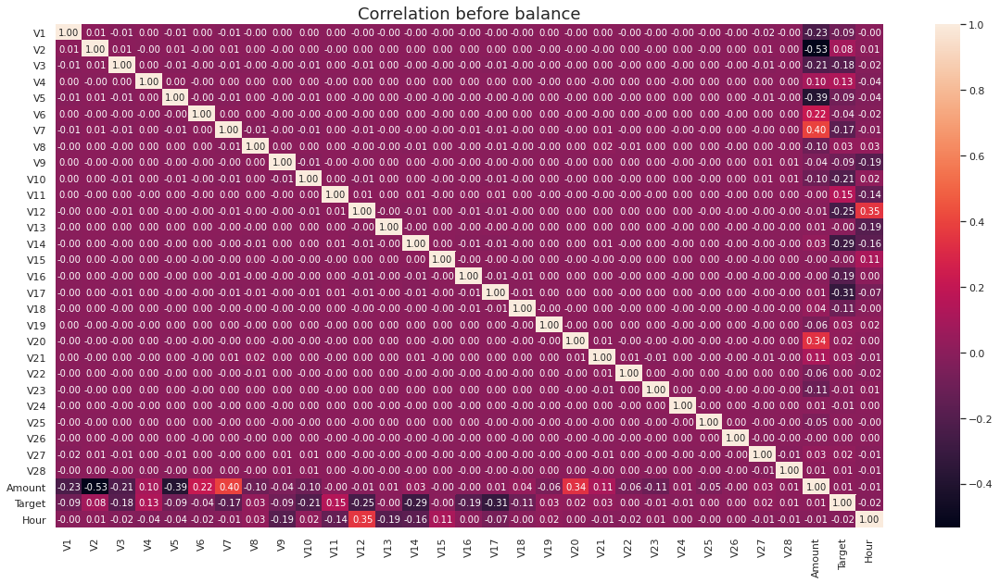

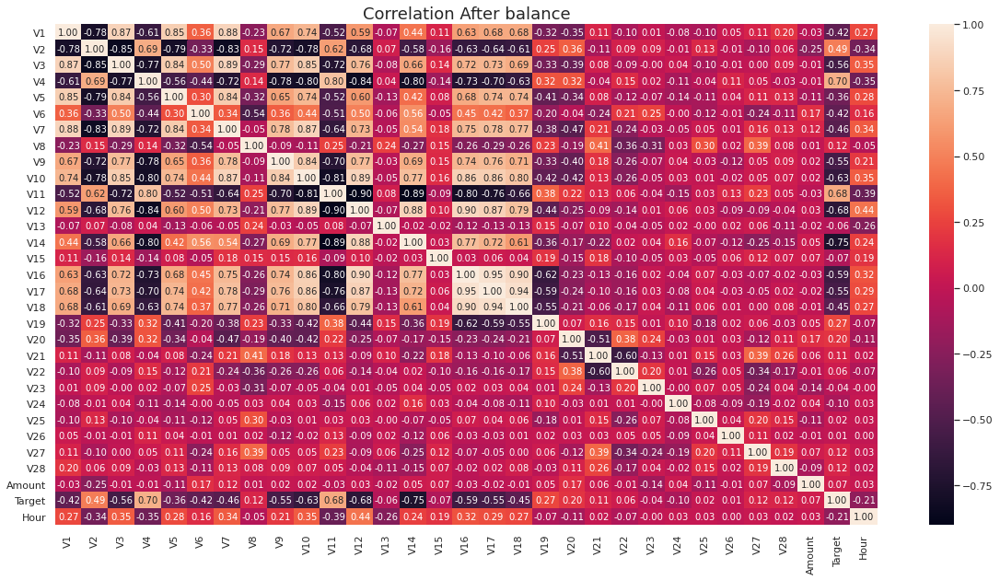

In [130]:
# Make sure to use the subsample in the correlation

plt.figure(figsize = (20,10))

# Use the original dataset to find the correlations between the features
correlation_matrix_before = df_train.corr()
sns.heatmap(correlation_matrix_before, annot=True,fmt=".2f")
plt.title('Correlation before balance',fontdict={'size':'18'})
plt.show()

plt.figure(figsize = (20,10))

# Use the original dataset to find the correlations between the features
correlation_matrix_after = balanced_df.corr()# Enter your code here
sns.heatmap(correlation_matrix_after, annot=True,fmt=".2f")
plt.title('Correlation After balance',fontdict={'size':'18'})
plt.show()

**Question**: What can you deduce from looking at the different correlation matrices? If you see a difference, can you analyze why there is a difference?

**Answer:** In the unbalanced set, the correlation matrix didn't show any **linear** relationships, but in this smaller balanced dataset, you can see some linear relationships. 

**Question**: Would you drop any columns because of the correlated data?

**Answer:** Yes, remove any features that have more than 85% correlation.

In [131]:
def remove_corr(df,thresh=0.85):
    """
    remove_corr(df,thresh=0.85):
        return columns with thresh correlation to drop
    Parameters:
        df: dataframe
            correlation_matrix
        thresh: float
            correlation threshold
    return columns' name to be droped
    """
    removed_col=set()
    for col in df.columns:
        if col in removed_col:
            continue
        else:
            upper_thresh = (df[col]>=thresh)&(df[col]<1)
            lowwer_thresh = (df[col]<=-1*thresh) & (df[col]>-1)
            idx = np.where(upper_thresh | lowwer_thresh)
            temp = df.iloc[idx].index
            
            if len(temp):
                removed_col.update(list(temp))
    return removed_col

In [133]:
drop_col = remove_corr(correlation_matrix_after,0.89)
drop_col

{'V12', 'V17', 'V18'}

Because there are some correlations, let's remove the correlated data that has more than 0.89 correlation.

In [134]:
balanced_df_drop = balanced_df.drop(columns=drop_col)

In [135]:
balanced_df_drop.shape

(946, 28)

Now it's time to train, deploy, and evaluate using the new balanced dataset.

In [136]:
# Use the function to create your datasets
train_features, test_features, train_labels, test_labels, val_features, val_labels = create_training_sets(balanced_df_drop,'Target')

print("Length of train_features is:", train_features.shape)
print("Length of train_labels is:" ,train_labels.shape)
print("Length of val_features is: ",val_features.shape)
print("Length of val_labels is: ",val_labels.shape)
print("Length of test_features is: ",test_features.shape)
print("Length of test_labels is: ",test_labels.shape)

Length of train_features is: (756, 27)
Length of train_labels is: (756,)
Length of val_features is:  (95, 27)
Length of val_labels is:  (95,)
Length of test_features is:  (95, 27)
Length of test_labels is:  (95,)


In [137]:
linear_estimator_balanced = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               instance_count=1,
                                               instance_type='ml.m4.xlarge',
                                               predictor_type='binary_classifier')


train_records_bal = linear_estimator_balanced.record_set(train_features, train_labels, channel='train')
val_records_bal = linear_estimator_balanced.record_set(val_features, val_labels, channel='validation')
test_records_bal = linear_estimator_balanced.record_set(test_features, test_labels, channel='test')

linear_estimator_balanced.fit([train_records_bal, val_records_bal, test_records_bal])

Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


2021-03-22 19:45:39 Starting - Starting the training job...
2021-03-22 19:46:04 Starting - Launching requested ML instancesProfilerReport-1616442338: InProgress
.........
2021-03-22 19:47:24 Starting - Preparing the instances for training......
2021-03-22 19:48:39 Downloading - Downloading input data......
2021-03-22 19:49:40 Training - Training image download completed. Training in progress..Docker entrypoint called with argument(s): train
Running default environment configuration script
[03/22/2021 19:49:45 INFO 140389653051200] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/resources/default-input.json: {'mini_batch_size': '1000', 'epochs': '15', 'feature_dim': 'auto', 'use_bias': 'true', 'binary_classifier_model_selection_criteria': 'accuracy', 'f_beta': '1.0', 'target_recall': '0.8', 'target_precision': '0.8', 'num_models': 'auto', 'num_calibration_samples': '10000000', 'init_method': 'uniform', 'init_scale': '0.07', 'init_sigma': '0.01', 'ini

In [138]:
linear_predictor_balanced = linear_estimator_balanced.deploy(initial_instance_count=1, instance_type='ml.m4.xlarge')

Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


-------------!

Accuracy: 0.9263157894736842
Precision: 0.9772727272727273
Recall: 0.8775510204081632


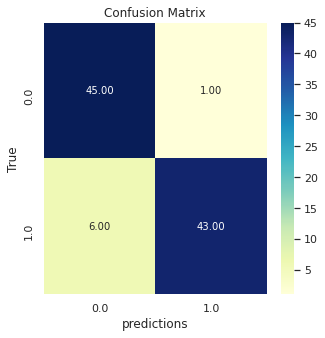

In [139]:
predict_batches(linear_predictor_balanced, test_features, test_labels,5)

Accuracy: 0.9312169312169312
Precision: 0.9655172413793104
Recall: 0.8936170212765957


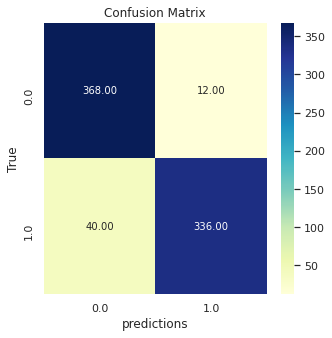

In [140]:
predict_batches(linear_predictor_balanced, train_features, train_labels,5)

In [141]:
# Delete inference endpoint
sagemaker.Session().delete_endpoint(linear_predictor_balancedbalanced.endpoint)

The endpoint attribute has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


Reducing the number of examples made the recall to go up. Let's try a different strategy, because we need a high recall.

In [176]:
from imblearn.over_sampling import SMOTE 

# Drop the columns from your original dataset that you don't need
X = df_train.drop(columns='Target')

# Use the class feature as the labels
y = df_train['Target']

sm = SMOTE(random_state=35)
X_res, y_res = sm.fit_resample(X, y)

**Optional**: Convert the new dataset to a Pandas DataFrame and check the shape and distribution of the data.

In [177]:
X_res.shape

(566506, 30)

In [178]:
X_res.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Hour
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [179]:
smote_df = X_res
smote_df['Target'] = y_res
smote_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Amount,Hour,Target
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0


In [180]:
smote_df.duplicated().sum()

2804

In [181]:
smote_df.drop_duplicates(inplace=True)

In [182]:
smote_df.duplicated().sum()

0

##### Check for correlation between features after oversampling

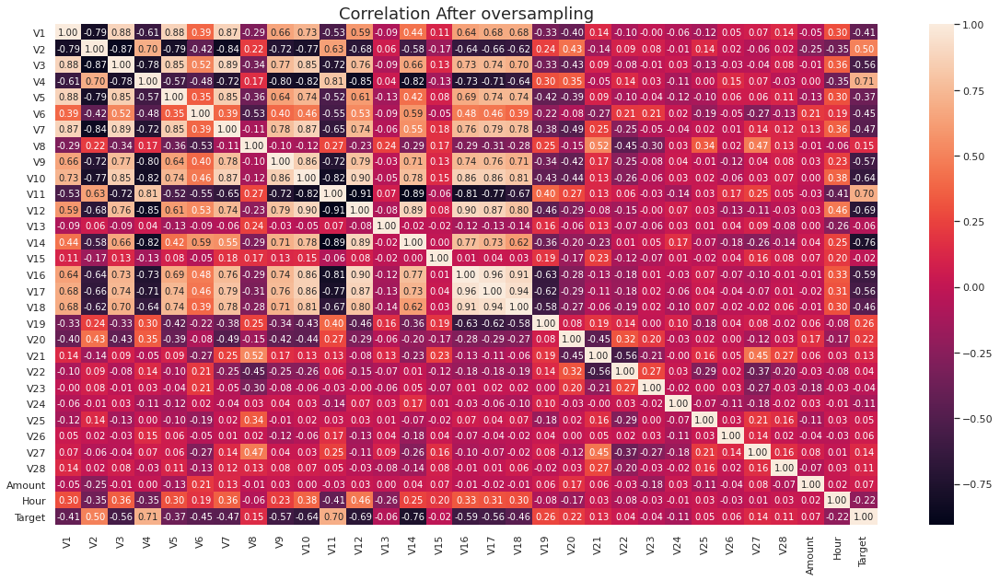

In [183]:
plt.figure(figsize = (20,10))

correlation_matrix_over = smote_df.corr()
sns.heatmap(correlation_matrix_over, annot=True,fmt=".2f");

plt.title('Correlation After oversampling',fontdict={'size':'18'})
plt.show()

As we see here, there are more correlations after oversampling the data than undersampling it.<br>
So we will remove Again `correlated` features with 0.89 value.

In [185]:
drop_col = remove_corr(correlation_matrix_over,0.89)
print(drop_col)
smote_df = smote_df.drop(columns=drop_col)

{'V12', 'V17', 'V14', 'V7', 'V18'}


In [186]:
smote_df.shape

(563702, 26)

Create new train, test, and validation datasets.

In [187]:
train_features, test_features, train_labels, test_labels, val_features, val_labels = create_training_sets(smote_df,'Target')

Train your model using the new dataset.

In [188]:
linear_estimator_smote = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               train_instance_count=1,
                                               train_instance_type='ml.m5.xlarge',
                                               predictor_type='binary_classifier')


train_records_smote = linear_estimator_smote.record_set(train_features, train_labels, channel='train')
val_records_smote = linear_estimator_smote.record_set(val_features, val_labels, channel='validation')
test_records_smote = linear_estimator_smote.record_set(test_features, test_labels, channel='test')

linear_estimator_smote.fit([train_records_smote, val_records_smote, test_records_smote])

train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


2021-03-22 20:04:04 Starting - Starting the training job...
2021-03-22 20:04:28 Starting - Launching requested ML instancesProfilerReport-1616443443: InProgress
......
2021-03-22 20:05:28 Starting - Preparing the instances for training......
2021-03-22 20:06:28 Downloading - Downloading input data...
2021-03-22 20:07:00 Training - Training image download completed. Training in progress..Docker entrypoint called with argument(s): train
Running default environment configuration script
[03/22/2021 20:07:04 INFO 140462947600192] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/resources/default-input.json: {'mini_batch_size': '1000', 'epochs': '15', 'feature_dim': 'auto', 'use_bias': 'true', 'binary_classifier_model_selection_criteria': 'accuracy', 'f_beta': '1.0', 'target_recall': '0.8', 'target_precision': '0.8', 'num_models': 'auto', 'num_calibration_samples': '10000000', 'init_method': 'uniform', 'init_scale': '0.07', 'init_sigma': '0.01', 'init_bias

**Increasing** the number of examples made the recall to go up 0.929.

#### Try  standerscaling

In [189]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(train_features)
train_features_scaled = scaler.transform(train_features)
val_features_scaled = scaler.transform(val_features)
test_features_scaled = scaler.transform(test_features)

In [190]:
train_features_scaled.shape

(450961, 25)

In [192]:
linear_estimator_smote = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               train_instance_count=1,
                                               train_instance_type='ml.m5.xlarge',
                                               predictor_type='binary_classifier')


train_records_smote = linear_estimator_smote.record_set(train_features_scaled, train_labels, channel='train')
val_records_smote = linear_estimator_smote.record_set(val_features_scaled, val_labels, channel='validation')
test_records_smote = linear_estimator_smote.record_set(test_features_scaled, test_labels, channel='test')

linear_estimator_smote.fit([train_records_smote, val_records_smote, test_records_smote])

train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


2021-03-22 20:17:04 Starting - Starting the training job...
2021-03-22 20:17:15 Starting - Launching requested ML instancesProfilerReport-1616444224: InProgress
......
2021-03-22 20:18:26 Starting - Preparing the instances for training......
2021-03-22 20:19:23 Downloading - Downloading input data...
2021-03-22 20:19:59 Training - Training image download completed. Training in progress..Docker entrypoint called with argument(s): train
Running default environment configuration script
[03/22/2021 20:20:04 INFO 140710537553728] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/resources/default-input.json: {'mini_batch_size': '1000', 'epochs': '15', 'feature_dim': 'auto', 'use_bias': 'true', 'binary_classifier_model_selection_criteria': 'accuracy', 'f_beta': '1.0', 'target_recall': '0.8', 'target_precision': '0.8', 'num_models': 'auto', 'num_calibration_samples': '10000000', 'init_method': 'uniform', 'init_scale': '0.07', 'init_sigma': '0.01', 'init_bias

**Standerscaling** don't affect the recall 0.929.

#### Try  MinMaxScaler

In [193]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(train_features)
train_features_scaled = scaler.transform(train_features)
val_features_scaled = scaler.transform(val_features)
test_features_scaled = scaler.transform(test_features)

In [194]:
linear_estimator_smote_min = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               train_instance_count=1,
                                               train_instance_type='ml.m5.xlarge',
                                               predictor_type='binary_classifier')


train_records_smote = linear_estimator_smote_min.record_set(train_features_scaled, train_labels, channel='train')
val_records_smote = linear_estimator_smote_min.record_set(val_features_scaled, val_labels, channel='validation')
test_records_smote = linear_estimator_smote_min.record_set(test_features_scaled, test_labels, channel='test')

linear_estimator_smote_min.fit([train_records_smote, val_records_smote, test_records_smote])

train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


2021-03-22 20:24:02 Starting - Starting the training job...
2021-03-22 20:24:04 Starting - Launching requested ML instancesProfilerReport-1616444642: InProgress
......
2021-03-22 20:25:32 Starting - Preparing the instances for training......
2021-03-22 20:26:31 Downloading - Downloading input data...
2021-03-22 20:26:53 Training - Training image download completed. Training in progress.Docker entrypoint called with argument(s): train
Running default environment configuration script
[03/22/2021 20:26:56 INFO 139804890085184] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/resources/default-input.json: {'mini_batch_size': '1000', 'epochs': '15', 'feature_dim': 'auto', 'use_bias': 'true', 'binary_classifier_model_selection_criteria': 'accuracy', 'f_beta': '1.0', 'target_recall': '0.8', 'target_precision': '0.8', 'num_models': 'auto', 'num_calibration_samples': '10000000', 'init_method': 'uniform', 'init_scale': '0.07', 'init_sigma': '0.01', 'init_bias'

In [196]:
smote_df = smote_df.sample(frac=1)
smote_df.head()

,V1,V2,V3,V4,V5,V6,V8,V9,V10,V11,...,V22,V23,V24,V25,V26,V27,V28,Amount,Hour,Target
444638,-1.591619,3.821128,-7.453098,7.169654,-1.585670,-1.764038,1.598013,-2.293247,-6.855235,6.893441,...,0.259756,-0.073674,-0.522221,-0.611021,0.005976,0.300756,-0.308927,2.112794,4,1
249622,1.891076,-0.570211,-0.507267,0.283717,-0.578061,-0.171396,0.139476,1.218316,0.020303,0.271478,...,-0.454308,0.277269,-0.566051,-0.448963,-0.612983,0.015300,-0.040608,49.990000,19,0
481887,1.411728,0.957441,-0.936265,3.555220,0.503031,-0.372009,0.179135,-0.537993,-0.250580,0.804410,...,-0.166179,-0.010351,-0.235448,0.229353,0.107602,0.028963,0.051982,0.429556,17,1
399938,-2.063357,-0.646713,-2.206225,2.059792,-3.988727,0.462521,0.635093,-0.768823,-4.543119,2.976180,...,0.638918,1.699302,0.312863,0.487601,-0.198049,0.167841,0.181623,817.177640,17,1
114427,-0.595087,1.334715,1.183348,-0.055506,0.241736,-0.509307,0.029552,-0.334808,-0.271364,0.174117,...,-0.528052,0.010147,0.041667,-0.155195,0.103328,0.373395,0.156365,0.890000,20,0


In [197]:
count = smote_df.groupby('Hour')['Target'].sum()
smote_df['count_target'] = smote_df['Hour'].map(count)
smote_df.head()

,V1,V2,V3,V4,V5,V6,V8,V9,V10,V11,...,V23,V24,V25,V26,V27,V28,Amount,Hour,Target,count_target
444638,-1.591619,3.821128,-7.453098,7.169654,-1.585670,-1.764038,1.598013,-2.293247,-6.855235,6.893441,...,-0.073674,-0.522221,-0.611021,0.005976,0.300756,-0.308927,2.112794,4,1,10114
249622,1.891076,-0.570211,-0.507267,0.283717,-0.578061,-0.171396,0.139476,1.218316,0.020303,0.271478,...,0.277269,-0.566051,-0.448963,-0.612983,0.015300,-0.040608,49.990000,19,0,12716
481887,1.411728,0.957441,-0.936265,3.555220,0.503031,-0.372009,0.179135,-0.537993,-0.250580,0.804410,...,-0.010351,-0.235448,0.229353,0.107602,0.028963,0.051982,0.429556,17,1,17219
399938,-2.063357,-0.646713,-2.206225,2.059792,-3.988727,0.462521,0.635093,-0.768823,-4.543119,2.976180,...,1.699302,0.312863,0.487601,-0.198049,0.167841,0.181623,817.177640,17,1,17219
114427,-0.595087,1.334715,1.183348,-0.055506,0.241736,-0.509307,0.029552,-0.334808,-0.271364,0.174117,...,0.010147,0.041667,-0.155195,0.103328,0.373395,0.156365,0.890000,20,0,8512


In [198]:
train_features, test_features, train_labels, test_labels, val_features, val_labels = create_training_sets(smote_df,'Target')

In [199]:
scaler = StandardScaler()
scaler.fit(train_features)
train_features_scaled = scaler.transform(train_features)
val_features_scaled = scaler.transform(val_features)
test_features_scaled = scaler.transform(test_features)

In [200]:
linear_estimator_smote_co_target = sagemaker.LinearLearner(role=sagemaker.get_execution_role(),
                                               train_instance_count=1,
                                               train_instance_type='ml.m5.xlarge',
                                               predictor_type='binary_classifier')


train_records_smote = linear_estimator_smote_co_target.record_set(train_features_scaled, train_labels, channel='train')
val_records_smote = linear_estimator_smote_co_target.record_set(val_features_scaled, val_labels, channel='validation')
test_records_smote = linear_estimator_smote_co_target.record_set(test_features_scaled, test_labels, channel='test')

linear_estimator_smote_co_target.fit([train_records_smote, val_records_smote, test_records_smote])

train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


2021-03-22 20:39:42 Starting - Starting the training job...
2021-03-22 20:39:44 Starting - Launching requested ML instancesProfilerReport-1616445582: InProgress
......
2021-03-22 20:41:09 Starting - Preparing the instances for training......
2021-03-22 20:42:09 Downloading - Downloading input data
2021-03-22 20:42:09 Training - Downloading the training image..Docker entrypoint called with argument(s): train
Running default environment configuration script
[03/22/2021 20:42:22 INFO 139901614024512] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/resources/default-input.json: {'mini_batch_size': '1000', 'epochs': '15', 'feature_dim': 'auto', 'use_bias': 'true', 'binary_classifier_model_selection_criteria': 'accuracy', 'f_beta': '1.0', 'target_recall': '0.8', 'target_precision': '0.8', 'num_models': 'auto', 'num_calibration_samples': '10000000', 'init_method': 'uniform', 'init_scale': '0.07', 'init_sigma': '0.01', 'init_bias': '0.0', 'optimizer': 'auto

**mean Target** increase the recall 0.930.

### Hyperparameter optimization
Another part of the model tuning phase is to perform hyperparameter optimization. This section gives you an opportunity to tune your hyperparameters to see the extent to which tuning improves your model performance. Use the following template code to help you get started launching an Amazon SageMaker hyperparameter tuning job and viewing the evaluation metrics. Use the following questions to help guide you through the rest of the section.

### Key questions to consider:
1. How does the outcome of your objective metric of choice change as timing of your tuning job increases? What's the relationship between the different objective metrics you're getting and time? 
2. What is the correlation between your objective metric and the individual hyperparameters? Is there a hyperparameter that has a strong correlation with your objective metric? If so, what might you do to leverage this strong correlation?
3. Analyze the performance of your model after hyperparameter tuning. Is current performance sufficient for what you need to solve your business problem?

#### <span style="color: blue;">Project presentation: Record key decisions and methods you use in this section in your project presentations, as well as any new performance metrics you obtain after evaluating your model again.</span>

In [203]:
from sagemaker.tuner import IntegerParameter, CategoricalParameter, ContinuousParameter, HyperparameterTuner

hyperparameter_ranges = {'wd': ContinuousParameter(1e-5, 1),
                        'l1': ContinuousParameter(1e-5, 0.01),
                        'learning_rate': ContinuousParameter(1e-4, 0.1)
                        }

objective_metric_name = 'test:recall'

tuner = HyperparameterTuner(linear_estimator_smote_co_target,
                            objective_metric_name,
                            hyperparameter_ranges,
                            max_jobs=6,
                            max_parallel_jobs=3)

tuner.fit([train_records_smote, val_records_smote, test_records_smote], include_cls_metadata=False,wait=False)

Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: 1.


### Track hyperparameter tuning job progress

After you launch a tuning job, you can see its progress by calling the `describe_tuning_job` API. The output from `describe-tuning-job` is a JSON object that contains information about the current state of the tuning job. You can call `list_training_jobs_for_tuning_job` to see a detailed list of the training jobs that the tuning job launched.

In [204]:
sagemaker_client = boto3.client('sagemaker')

job_name = tuner.latest_tuning_job.job_name
tuning_job_result = sagemaker_client.describe_hyper_parameter_tuning_job(HyperParameterTuningJobName=job_name)
tuner_describe = sagemaker_client.describe_hyper_parameter_tuning_job(
    HyperParameterTuningJobName=job_name)['HyperParameterTuningJobStatus']
tuner_describe



'InProgress'

In [205]:
from pprint import pprint
best_objective = 0
prev_job_count=0
while(1):
    
    status = tuning_job_result['HyperParameterTuningJobStatus']
    job_count = tuning_job_result['TrainingJobStatusCounters']['Completed']

        
    if job_count == 0:
        print("No training jobs have reported results yet.")
    #the current one is Better than the best one.
    elif (job_count!=prev_job_count) and tuning_job_result.get('BestTrainingJob',None):
        prev_job_count = job_count
        if best_objective < tuning_job_result['BestTrainingJob']['FinalHyperParameterTuningJobObjectiveMetric']['Value'] :
            print("New best model found:")
            pprint(tuning_job_result['BestTrainingJob'])
            best_objective = tuning_job_result['BestTrainingJob']['FinalHyperParameterTuningJobObjectiveMetric']['Value']

    else:
        print("Best model found so far:")
        pprint(tuning_job_result['BestTrainingJob'])
    
    if status != 'Completed':
        print('Reminder: the tuning job has not been completed.')
        print("training jobs status:")
        print(tuning_job_result['TrainingJobStatusCounters'])
        print('*'*50)

    else:
        objective_status = tuning_job_result['ObjectiveStatusCounters']
        print(objective_status)
        print("Best model found is:")
        pprint(tuning_job_result['BestTrainingJob'])
        break
        
    time.sleep(20)

No training jobs have reported results yet.
Reminder: the tuning job has not been completed.
training jobs status:
{'Completed': 0, 'InProgress': 0, 'RetryableError': 0, 'NonRetryableError': 0, 'Stopped': 0}
**************************************************
No training jobs have reported results yet.
Reminder: the tuning job has not been completed.
training jobs status:
{'Completed': 0, 'InProgress': 0, 'RetryableError': 0, 'NonRetryableError': 0, 'Stopped': 0}
**************************************************
No training jobs have reported results yet.
Reminder: the tuning job has not been completed.
training jobs status:
{'Completed': 0, 'InProgress': 0, 'RetryableError': 0, 'NonRetryableError': 0, 'Stopped': 0}
**************************************************
No training jobs have reported results yet.
Reminder: the tuning job has not been completed.
training jobs status:
{'Completed': 0, 'InProgress': 0, 'RetryableError': 0, 'NonRetryableError': 0, 'Stopped': 0}
***************

KeyboardInterrupt: 

In [206]:
client = boto3.Session().client('sagemaker')
tuning_job_result = client.describe_hyper_parameter_tuning_job(HyperParameterTuningJobName=tuner.latest_tuning_job.job_name)

status = tuning_job_result['HyperParameterTuningJobStatus']
while status != 'Completed':
    print('Reminder: the tuning job has not been completed.')
    
    job_count = tuning_job_result['TrainingJobStatusCounters']['Completed']
    print("%d training jobs have completed" % job_count)
    
    time.sleep(180)

    tuning_job_result = client.describe_hyper_parameter_tuning_job(HyperParameterTuningJobName=tuner.latest_tuning_job.job_name)
    status = tuning_job_result['HyperParameterTuningJobStatus']
    
print("\n\n All training jobs have completed")
is_minimize = (tuning_job_result['HyperParameterTuningJobConfig']['HyperParameterTuningJobObjective']['Type'] != 'Maximize')
objective_name = tuning_job_result['HyperParameterTuningJobConfig']['HyperParameterTuningJobObjective']['MetricName']



 All training jobs have completed


### Fetch all results as a DataFrame

You can list hyperparameters and objective metrics of all training jobs and pick up the training job with the best objective metric.

In [207]:
tuner_analytics = sagemaker.HyperparameterTuningJobAnalytics(tuner.latest_tuning_job.job_name)
df_analytic = pd.DataFrame()
full_df = tuner_analytics.dataframe()

if len(full_df) > 0:
    df_analytic = full_df[full_df['FinalObjectiveValue'] > -float('inf')]
    if len(df_analytic) > 0:
        df_analytic = df_analytic.sort_values('FinalObjectiveValue', ascending=is_minimize)
        print("Number of training jobs with valid objective: %d" % len(df_analytic))
        print({"lowest":min(df_analytic['FinalObjectiveValue']),"highest": max(df_analytic['FinalObjectiveValue'])})
        pd.set_option('display.max_colwidth', -1)  # Don't truncate TrainingJobName        
    else:
        print("No training jobs have reported valid results yet.")
        
df_analytic


Number of training jobs with valid objective: 6
{'lowest': 0.8347209692001343, 'highest': 0.9314894676208496}


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:11: FutureWarning:

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.



,l1,learning_rate,wd,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
4,0.001777,0.008025,0.000026,linear-learner-210322-2221-002-dc9de069,Completed,0.931489,2021-03-22 22:23:50+00:00,2021-03-22 22:25:11+00:00,81.0
1,0.000048,0.052844,0.003595,linear-learner-210322-2221-005-3bbe2072,Completed,0.919918,2021-03-22 22:27:47+00:00,2021-03-22 22:29:07+00:00,80.0
2,0.001755,0.021122,0.257124,linear-learner-210322-2221-004-0dae0957,Completed,0.906618,2021-03-22 22:27:29+00:00,2021-03-22 22:28:36+00:00,67.0
0,0.000097,0.003585,0.725663,linear-learner-210322-2221-006-9643e166,Completed,0.898681,2021-03-22 22:28:02+00:00,2021-03-22 22:29:41+00:00,99.0
3,0.000046,0.000482,0.079967,linear-learner-210322-2221-003-23e2f210,Completed,0.873809,2021-03-22 22:23:57+00:00,2021-03-22 22:25:13+00:00,76.0
5,0.000138,0.000170,0.000171,linear-learner-210322-2221-001-a9b3c8c2,Completed,0.834721,2021-03-22 22:23:50+00:00,2021-03-22 22:25:05+00:00,75.0


Deploy this as your final model and evaluate it on the test set.

In [ ]:
tuned_model_deploy = tuner.deploy(initial_instance_count=1, instance_type='ml.m4.xlarge')

Then, because you're training with the CSV file format, create s3_inputs that the training function can use as a pointer to the files in Amazon S3.

In [ ]:
predict_batches(tuned_model_deploy, test_features, test_labels)